<a href="https://colab.research.google.com/github/timkabot/NN-in-arts/blob/main/NN_in_Arts_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# LANGUAGE MODELS

**Setup: we will include a bunch of libraries**

In [ ]:
import nltk
import random
import numpy as np
from collections import Counter, OrderedDict
import nltk
from copy import deepcopy

In [ ]:
random.seed(123)

## Dinosaurus land Dataset

insired by [Kulbear](https://github.com/Kulbear/deep-learning-coursera/blob/master/Sequence%20Models/Dinosaurus%20Island%20--%20Character%20level%20language%20model%20final%20-%20v3.ipynb).

### Dataset and Preprocessing

Read the dataset of dinosaur names, create a list of unique characters (such as a-z), and compute the dataset and vocabulary size.

In [ ]:
names = [name.strip().lower() for name in open('dinos.txt').readlines()]
print(names[:10])

['aachenosaurus', 'aardonyx', 'abdallahsaurus', 'abelisaurus', 'abrictosaurus', 'abrosaurus', 'abydosaurus', 'acanthopholis', 'achelousaurus', 'acheroraptor']


### Bigrams + NLTK

In [ ]:
chars = [char  for name in names for char in name]
freq = nltk.FreqDist(chars)

print(list(freq.keys()))

['a', 'c', 'h', 'e', 'n', 'o', 's', 'u', 'r', 'd', 'y', 'x', 'b', 'l', 'i', 't', 'p', 'v', 'm', 'g', 'f', 'j', 'k', 'w', 'z', 'q']


In [ ]:
cfreq = nltk.ConditionalFreqDist(nltk.bigrams(chars))
print(cfreq['a'])

<FreqDist with 26 samples and 2487 outcomes>


In [ ]:
cprob = nltk.ConditionalProbDist(cfreq, nltk.MLEProbDist)
print('p(a, a) = %1.4f' %cprob['a'].prob('a'))
print('p(a, b) = %1.4f' %cprob['a'].prob('b'))
print('p(a, u) = %1.4f' %cprob['a'].prob('u'))

p(a, a) = 0.0105
p(a, b) = 0.0129
p(a, u) = 0.3185


In [ ]:
l = sum([freq[char] for char in freq])
def unigram_prob(char):
    return freq[char] / l
print('p(a) = %1.4f' %unigram_prob('a'))

p(a) = 0.1354


In [ ]:
cprob['a'].generate()

'c'

Write NLTK version of generating random DINASOUR NAME with length $n$.

In [ ]:
from string import ascii_lowercase
def generate(c,n):
  res = "" + c
  for i in range(n-1):
    mx = 0
    nxt = 'z'
    for c in ascii_lowercase:
      val = cprob[res[-1]].prob(c)
      if val > mx:
        mx = val
        nxt = c
    res = res + nxt
  return res

In [ ]:
generate('d', 100)

'dosausausausausausausausausausausausausausausausausausausausausausausausausausausausausausausausausa'

Does it really depend on $n$ characters??...




## RNN VERSION

# Character-Level RNN

<img src="http://karpathy.github.io/assets/rnn/charseq.jpeg"  width="500" />

An example RNN with 4-dimensional input and output layers, and a hidden layer of 3 units (neurons). This diagram shows the activations in the forward pass when the RNN is fed the characters "hell" as input. The output layer contains confidences the RNN assigns for the next character (vocabulary is "h,e,l,o"); We want the green numbers to be high and red numbers to be low.

Source: [karpathy blog](http://karpathy.github.io/2015/05/21/rnn-effectiveness/)

### DINO Names generation

#### Data Preprocessing

The characters are a-z (26 characters) plus the "\n" (or newline character), which in this assignment plays a role similar to the <EOS> (or "End of sentence") token we had discussed in lecture, only here it indicates the end of the dinosaur name rather than the end of a sentence. In the cell below, we create a python dictionary (i.e., a hash table) to map each character to an index from 0-26.

In [ ]:
data = open('dinos.txt', 'r').read()
data = data.lower()
chars = list(set(data))
data_size, vocab_size = len(data), len(chars)
print('There are %d total characters and %d unique characters in your data.' % (data_size, vocab_size))
char_to_ix = { ch:i for i,ch in enumerate(sorted(chars)) }
ix_to_char = { i:ch for i,ch in enumerate(sorted(chars)) }
print(ix_to_char)

There are 19910 total characters and 27 unique characters in your data.
{0: '\n', 1: 'a', 2: 'b', 3: 'c', 4: 'd', 5: 'e', 6: 'f', 7: 'g', 8: 'h', 9: 'i', 10: 'j', 11: 'k', 12: 'l', 13: 'm', 14: 'n', 15: 'o', 16: 'p', 17: 'q', 18: 'r', 19: 's', 20: 't', 21: 'u', 22: 'v', 23: 'w', 24: 'x', 25: 'y', 26: 'z'}


Converse it into a dataset.

In [ ]:
from torch.utils.data import Dataset, DataLoader

class DinosDataset(Dataset):
    def __init__(self):
        super().__init__()
        with open('dinos.txt') as f:
            content = f.read().lower()
            self.vocab = sorted(set(content))
            self.vocab_size = len(self.vocab)
            self.lines = content.splitlines()
        self.ch_to_idx = { ch:i for i,ch in enumerate(sorted(chars)) }
        self.idx_to_ch = { i:ch for i,ch in enumerate(sorted(chars)) }
    
    def __getitem__(self, index):
        line = self.lines[index]

        x_str = line
        y_str = line[1:] + '\n'
        x = torch.zeros([len(x_str), self.vocab_size], dtype=torch.float)
        y = torch.empty(len(x_str), dtype=torch.long)
        for i, (x_ch, y_ch) in enumerate(zip(x_str, y_str)):
            x[i][self.ch_to_idx[x_ch]] = 1
            y[i] = self.ch_to_idx[y_ch]
        
        return x, y
    
    def __len__(self):
        return len(self.lines)

In [ ]:
dino_dataset = DinosDataset()
print(dino_dataset.lines)

['aachenosaurus', 'aardonyx', 'abdallahsaurus', 'abelisaurus', 'abrictosaurus', 'abrosaurus', 'abydosaurus', 'acanthopholis', 'achelousaurus', 'acheroraptor', 'achillesaurus', 'achillobator', 'acristavus', 'acrocanthosaurus', 'acrotholus', 'actiosaurus', 'adamantisaurus', 'adasaurus', 'adelolophus', 'adeopapposaurus', 'aegyptosaurus', 'aeolosaurus', 'aepisaurus', 'aepyornithomimus', 'aerosteon', 'aetonyxafromimus', 'afrovenator', 'agathaumas', 'aggiosaurus', 'agilisaurus', 'agnosphitys', 'agrosaurus', 'agujaceratops', 'agustinia', 'ahshislepelta', 'airakoraptor', 'ajancingenia', 'ajkaceratops', 'alamosaurus', 'alaskacephale', 'albalophosaurus', 'albertaceratops', 'albertadromeus', 'albertavenator', 'albertonykus', 'albertosaurus', 'albinykus', 'albisaurus', 'alcovasaurus', 'alectrosaurus', 'aletopelta', 'algoasaurus', 'alioramus', 'aliwalia', 'allosaurus', 'almas', 'alnashetri', 'alocodon', 'altirhinus', 'altispinax', 'alvarezsaurus', 'alwalkeria', 'alxasaurus', 'amargasaurus', 'amarga

### Build Model

##### Setup

In [ ]:
import numpy as np
import random
import torch
import torch.nn as nn
import torch.optim as optim
import pdb
from torch.utils.data import Dataset, DataLoader

%load_ext autoreload
%autoreload 2

torch.set_printoptions(linewidth=200)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
class RNN(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super().__init__()
        self.Wh = nn.Linear(input_size + hidden_size, hidden_size)
        self.dropout = nn.Dropout(0.3)
        self.Ws = nn.Linear(input_size + hidden_size, output_size)
    
    def forward(self, h_prev, x):
        combined = torch.cat([h_prev, x], dim = 1)
        h = torch.tanh(self.dropout(self.Wh(combined)))
        y = self.Ws(combined)
        return h, y

### Train


In [ ]:
train_dino_dataloader = DataLoader(dino_dataset, shuffle=True)
next(iter(train_dino_dataloader))

[tensor([[[0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
          [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
          [0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
          [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
          [0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
          [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
          [0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
          [0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]]),
 tensor([[12,  9, 23,  1, 12,  9,  1,

In [ ]:
input_size = dino_dataset.vocab_size # == 27
hidden_size = 50
  
model = RNN(input_size, hidden_size, input_size).to(device)
cross_entropy = nn.CrossEntropyLoss()
sgd = optim.SGD(model.parameters(), lr=1e-2) # or Adam or RSMPROP

In [ ]:
def train_one_epoch(model, objective, optimizer):
    model.train()
    for batch, (x, y) in enumerate(train_dino_dataloader):
        loss = 0
        optimizer.zero_grad()
        h_prev = torch.zeros([1, hidden_size], dtype=torch.float, device=device)
        x, y = x.to(device), y.to(device)
        
        for i in range(x.shape[1]):
            h_prev, y_pred = model(h_prev, x[:, i])
            loss += objective(y_pred, y[:, i])
            
        loss.backward()
        optimizer.step()

In [ ]:
def train(model, objective, optimizer, dataset='dinos', epochs=1):
    for e in range(1, epochs + 1):
        print('Epoch:{}'.format(e))
        train_one_epoch(model, objective, optimizer)
        print()

In [ ]:
train(model, cross_entropy, sgd, epochs = 25)

Epoch:1

Epoch:2

Epoch:3

Epoch:4

Epoch:5

Epoch:6

Epoch:7

Epoch:8

Epoch:9

Epoch:10

Epoch:11

Epoch:12

Epoch:13

Epoch:14

Epoch:15

Epoch:16

Epoch:17

Epoch:18

Epoch:19

Epoch:20

Epoch:21

Epoch:22

Epoch:23

Epoch:24

Epoch:25



### Sample

In [ ]:
def sample(model):
    model.eval()
    word_size=0
    newline_idx = dino_dataset.ch_to_idx['\n']
    with torch.no_grad():
        h_prev = torch.zeros([1, hidden_size], dtype=torch.float, device=device)
        x = h_prev.new_zeros([1, dino_dataset.vocab_size])
        start_char_idx = random.randint(1, dino_dataset.vocab_size-1)
        indices = [start_char_idx]
        x[0, start_char_idx] = 1
        predicted_char_idx = start_char_idx
        
        while predicted_char_idx != newline_idx and word_size != 50:
            h_prev, y_pred = model(h_prev, x)
            y_softmax_scores = torch.softmax(y_pred, dim=1)
            
            np.random.seed(np.random.randint(1, 5000))
            idx = np.random.choice(np.arange(dino_dataset.vocab_size), p=y_softmax_scores.cpu().numpy().ravel())
            indices.append(idx)
            
            x = (y_pred == y_pred.max(1)[0]).float()
            predicted_char_idx = idx
            
            word_size += 1
        
        if word_size == 50:
            indices.append(newline_idx)
    return indices

In [ ]:
sample(model)

[3, 1, 9, 1, 20, 15, 16, 1, 21, 18, 21, 19, 0]

Add some kind of logger: at least sample, better loss.

In [ ]:
def train_one_epoch(model, objective, optimizer):
    model.train()
    for i, (x, y) in enumerate(train_dino_dataloader):
        loss = 0
        optimizer.zero_grad()
        h_prev = torch.zeros([1, hidden_size], dtype=torch.float, device=device)
        x, y = x.to(device), y.to(device)
        for i in range(x.shape[1]):
            h_prev, y_pred = model(h_prev, x[:, i])
            loss += objective(y_pred, y[:, i])
            
        if (line_num+1) % 100 == 0:
            print_sample(sample(model))
        loss.backward()
        optimizer.step()

In [ ]:
train(model, cross_entropy, sgd, epochs = 25)

Epoch:1


NameError: ignored

# Hometask. Part 1.

Implement LSTM.

Evaluate on another set of data -> text generation.


In [ ]:
data = open('Pride_and_Prejudice.txt', 'r').read()
data = data.lower()
chars = list(set(data))
data_size, vocab_size = len(data), len(chars)
print('There are %d total characters and %d unique characters in your data.' % (data_size, vocab_size))
char_to_ix = { ch:i for i,ch in enumerate(sorted(chars)) }
ix_to_char = { i:ch for i,ch in enumerate(sorted(chars)) }
print(ix_to_char)
from torch.utils.data import Dataset, DataLoader

class MyDataset(Dataset):
    def __init__(self):
        super().__init__()
        with open('Pride_and_Prejudice.txt') as f:
            content = f.read().lower()
            self.vocab = sorted(set(content))
            self.vocab_size = len(self.vocab)
            self.lines = content.splitlines()
        self.ch_to_idx = { ch:i for i,ch in enumerate(sorted(chars)) }
        self.idx_to_ch = { i:ch for i,ch in enumerate(sorted(chars)) }
    
    def __getitem__(self, index):
        line = self.lines[index]

        x_str = line
        y_str = line[1:] + '\n'
        x = torch.zeros([len(x_str), self.vocab_size], dtype=torch.float)
        y = torch.empty(len(x_str), dtype=torch.long)
        for i, (x_ch, y_ch) in enumerate(zip(x_str, y_str)):
            x[i][self.ch_to_idx[x_ch]] = 1
            y[i] = self.ch_to_idx[y_ch]
        
        return x, y
    
    def __len__(self):
        return len(self.lines)
trn_ds = MyDataset()
trn_dl = DataLoader(trn_ds, shuffle=True)


There are 683267 total characters and 66 unique characters in your data.
{0: '\n', 1: ' ', 2: '!', 3: '"', 4: "'", 5: '(', 6: ')', 7: '*', 8: ',', 9: '-', 10: '.', 11: '/', 12: '0', 13: '1', 14: '2', 15: '3', 16: '4', 17: '5', 18: '6', 19: '7', 20: '8', 21: '9', 22: ':', 23: ';', 24: '?', 25: 'a', 26: 'b', 27: 'c', 28: 'd', 29: 'e', 30: 'f', 31: 'g', 32: 'h', 33: 'i', 34: 'j', 35: 'k', 36: 'l', 37: 'm', 38: 'n', 39: 'o', 40: 'p', 41: 'q', 42: 'r', 43: 's', 44: 't', 45: 'u', 46: 'v', 47: 'w', 48: 'x', 49: 'y', 50: 'z', 51: 'а', 52: 'б', 53: 'в', 54: 'е', 55: 'и', 56: 'к', 57: 'л', 58: 'н', 59: 'о', 60: 'п', 61: 'р', 62: 'с', 63: 'т', 64: 'у', 65: '—'}


In [ ]:
class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(LSTM, self).__init__()
        self.linear_f = nn.Linear(input_size + hidden_size, hidden_size)
        self.linear_u = nn.Linear(input_size + hidden_size, hidden_size)
        self.linear_c = nn.Linear(input_size + hidden_size, hidden_size)
        self.linear_o = nn.Linear(input_size + hidden_size, hidden_size)
        
        self.i2o = nn.Linear(hidden_size, output_size)
        
    def forward(self, c_prev, h_prev, x):
        combined = torch.cat([x, h_prev], 1)
        f = torch.sigmoid(self.linear_f(combined))
        u = torch.sigmoid(self.linear_u(combined))
        c_tilde = torch.tanh(self.linear_c(combined))
        c = f*c_prev + u*c_tilde
        o = torch.sigmoid(self.linear_o(combined))
        h = o*torch.tanh(c)
        y = self.i2o(h)
        
        return c, h, y

model = LSTM(trn_ds.vocab_size, hidden_size, trn_ds.vocab_size).to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-2)

In [ ]:
def print_sample(sample_idxs):
    [print(trn_ds.idx_to_ch[x], end='') for x in sample_idxs]
def sample(model):
    model.eval()
    with torch.no_grad():
        c_prev = torch.zeros([1, hidden_size], dtype=torch.float, device=device)
        h_prev = torch.zeros_like(c_prev)
        idx = random.randint(1, 26)
        x = c_prev.new_zeros([1, trn_ds.vocab_size])
        x[0, idx] = 1
        sampled_indexes = [idx]
        n_chars = 1
        newline_char_idx = trn_ds.ch_to_idx['\n']
        while n_chars != 50 and idx != newline_char_idx:
            c_prev, h_prev, y_pred = model(c_prev, h_prev, x)
            
            np.random.seed(np.random.randint(1, 5000))
            idx = np.random.choice(np.arange(trn_ds.vocab_size), p=torch.softmax(y_pred, 1).cpu().numpy().ravel())
            sampled_indexes.append(idx)
            
            x = (y_pred == y_pred.max(1)[0]).float()
            
            n_chars += 1
            
            if n_chars == 50:
                sampled_indexes.append(newline_char_idx)
                
    model.train()
    return sampled_indexes
def train_one_epoch(model, loss_fn, optimizer):
    model.train()
    for line_num, (x, y) in enumerate(trn_dl):
        loss = 0
        optimizer.zero_grad()
        c_prev = torch.zeros([1, hidden_size], dtype=torch.float, device=device)
        h_prev = torch.zeros_like(c_prev)
        x, y = x.to(device), y.to(device)
        for i in range(x.shape[1]):
            c_prev, h_prev, y_pred = model(c_prev, h_prev, x[:, i])
            loss += loss_fn(y_pred, y[:, i])
            
        if (line_num+1) % 100 == 0:
            print_sample(sample(model))
        if(loss != 0):
          loss.backward()
        optimizer.step()
loss_fn = nn.CrossEntropyLoss()

train(model, loss_fn, optimizer, epochs = 10)


Epoch:1
au
2by yceormharsee woe t,a s acihonlbarbeadneertwetm
-fb.nboes eshttg rhela teevk iheddtwhedn coem oahu
'stbssejli,ivo srs hn  tbl t  al d tnd tbdnot etsd
! sirythertar.ahi ter boe kar hei hortboirkerliui 
1rrtae ahe shi dhe mhe iei koesdiillheekte shi jha
6do;rhoa sha doe aoa who toi foe woelsoa leerboeta
61rmae sen talsoo etin silvterdtaf aer ter cin lar
/el naho wassthe rawrlheraan hoaefic tha cimcaoa w
/oveoe ler jre pir iha sar uee lar the tarspoe tir
! somue rouad ahi rhvbd.ke doe ar-lt!vh toe ronvl 
)ltoa lagmaoetaar aherhe rahoktarrthenresnmoesaer 
(do chi  sec dir aid wir tit fir wim ti  iad airia
/,tea coe boblm whirromrd woeerr ld foanfr gd ahen
6fn la wowcitl fnsiwuisl a ma tatl a so natl anaiw
/qwave lhenkrspitoa lact the diiaecoe aianuooarsii
; ondithentacn foamgid sn  coe aid wnr toe fer wrd
, ts  mhenbucl bsd mhe hash wpq toe furhttnd tee b
) the taisi?g the saryioe,toe rprytng vee bas sng 
 der mhe hargewhe sorr sheysenrsahe goarcuaealaflr
264)р)9ткс*ррпб3ппqу

KeyboardInterrupt: ignored

### It was training for 2 hours, and still 4 epochs, so decided to break here
### Samples don't seem to be realistic

inspired by [MelLain](https://github.com/MelLain/hse-nlp/blob/master/seminars/sem5_LMs/Dinosaur%20Island%20LM.ipynb)

# FIN PART

In [ ]:
import numpy as np
import pandas as pd
from os import listdir
from lxml.html import fromstring

from matplotlib import pyplot as plt

%matplotlib inline

You can load any text in txt format, let's experiment here.

In [ ]:
sents = [sent.lower() for sent in open('Yudkowsky_-_Harry_Potter_and_the_Methods_of_Rationality.txt').read().split('.')]
print(sents[:10])

['\n\n\nchapter 1', ' a day of very low probability\n\ndisclaimer: j', ' k', ' rowling owns harry potter, and no one owns the methods of rationality', '\n\nthis fic is widely considered to have really hit its stride starting at around chapter 5', " if you still don't like it after chapter 10, give up", "\n\nplease visit hpmor dot com for:\n\n* easy email notification system, rss feed, and twitter feed for new chapters;\n* current author's notes and progress updates;\n* lovely fan-made book-style pdf version;\n* ad-free mirror of the text;\n* epub and mobi e-texts;\n* ongoing podcast of the story;\n* fan art in vast quantities;\n* cameo list (characters named after fan artists);\n* fan-fanfiction of this fanfiction;\n* fan music, songs, and animations;\n* fan translations;\n* the okcupid keyword for hpmor readers;\n* links to tv tropes page and discussion forum;\n* trigger warnings page (warnings about possible traumatic associations for some readers; to avoid spoilers for most readers,

In [ ]:
sents_pd = pd.DataFrame(sents, columns=['text'])
sents_pd.head()

,text
0,\n\n\nchapter 1
1,a day of very low probability\n\ndisclaimer: j
2,k
3,"rowling owns harry potter, and no one owns th..."
4,\n\nthis fic is widely considered to have real...


### Preprocess


Replace punctuation, stop words and create lemmas using NLTK.

In [ ]:
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer 

from string import punctuation

In [ ]:
lemmatizer = WordNetLemmatizer()

nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('punkt')
stops = set(stopwords.words('english'))

punct = punctuation + '«»—…“”*№–'

def lemmatize(text):
    lemmas = [word.strip(punct) for word in text.lower().split()]
    lemmas = [lemmatizer.lemmatize(word) for word in lemmas if word and word not in stops]
    return " ".join(lemmas)

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
sents_pd['lemma'] = sents_pd.text
sents_pd.text = sents_pd.text.apply(lemmatize)
sents_pd = sents_pd.dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)
mask = (sents_pd['text'].str.len() > 1)
sents_pd = sents_pd.loc[mask]

In [ ]:
sents_pd.head(10)

,text,lemma
0,chapter 1,\n\n\nchapter 1
1,day low probability disclaimer j,a day of very low probability\n\ndisclaimer: j
3,rowling owns harry potter one owns method rati...,"rowling owns harry potter, and no one owns th..."
4,fic widely considered really hit stride starti...,\n\nthis fic is widely considered to have real...
5,still like chapter 10 give,"if you still don't like it after chapter 10, ..."
6,please visit hpmor dot com easy email notifica...,\n\nplease visit hpmor dot com for:\n\n* easy ...
7,review make happy,\n\nreviews make me happy
8,leave review chapter login required there's ne...,"you can leave reviews on any chapter, no logi..."
9,strict single-point-of-departure fic exists pr...,\n\nthis is not a strict single-point-of-depar...
10,best term i've heard fic parallel universe,the best term i've heard for this fic is para...


### Embeddings

Word2Vec from `gensim`.

In [ ]:
vocab = []
for sen in sents_pd.text:
    vocab += [nltk.word_tokenize(sen)]

In [ ]:
from gensim.models import Word2Vec, FastText

model = Word2Vec(vocab, size=300, window=5, min_count=5, workers=4)
model.save('word2v.model')
model.most_similar('harry')

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:398: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('boy', 0.9065626263618469),
 ('headmaster', 0.8941956758499146),
 ('neville', 0.8876368999481201),
 ('minerva', 0.8624457120895386),
 ('daphne', 0.862136960029602),
 ('susan', 0.8456919193267822),
 ('severus', 0.8398435115814209),
 ('word', 0.8379981517791748),
 ('oliver', 0.8355627059936523),
 ('tone', 0.8326433897018433)]

Compare with FastText from the same library `gensim`

In [ ]:
ft_model = FastText(vocab, size=300, min_n=5)
ft_model.most_similar('harry')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('marry', 0.9996640682220459),
 ('carry', 0.9996626377105713),
 ('civility', 0.9996180534362793),
 ('honourable', 0.9996176362037659),
 ('respect', 0.9996170997619629),
 ('occasion', 0.9996168613433838),
 ('accomplished', 0.999616265296936),
 ('accept', 0.9996161460876465),
 ('standing', 0.9996160268783569),
 ('sure', 0.9996160268783569)]

In [ ]:
ft_model.save('fasttext.model')

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:398: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


# Hometask 2.

Find fun pretrained W2V (w2v on poetry, nature, basically whatever)

In [ ]:
sents = [sent.lower() for sent in open('Pride_and_Prejudice.txt').read().split('.')]
sents_pd = pd.DataFrame(sents, columns=['text'])
sents_pd['lemma'] = sents_pd.text
sents_pd.text = sents_pd.text.apply(lemmatize)
sents_pd = sents_pd.dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)
mask = (sents_pd['text'].str.len() > 1)
sents_pd = sents_pd.loc[mask]
vocab = []
for sen in sents_pd.text:
    vocab += [nltk.word_tokenize(sen)]
pretrained = Word2Vec(vocab, size=300, window=5, min_count=5, workers=4)
pretrained.save('my.model')


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:398: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


In [ ]:

pretrained.most_similar('elizabeth')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('might', 0.9999805688858032),
 ('without', 0.9999804496765137),
 ('manner', 0.9999802112579346),
 ('though', 0.9999798536300659),
 ('sister', 0.9999794363975525),
 ('could', 0.9999783039093018),
 ('house', 0.9999781847000122),
 ('must', 0.9999780654907227),
 ('every', 0.9999777674674988),
 ('good', 0.9999777674674988)]

### For the "pride and prejudice" book the main character's name is Elizabeth, she has a lot of sisters, thats why "sister" is one of most probable meanings 

## Sentence Embeddings

+ mean Word2Vec

In [ ]:
class MeanEmbeddingVectorizer(object):
    def __init__(self, word2vec):
        self.word2vec = word2vec
        self.dim = len(w2v.popitem()[1])
        
    def fit(self, X, y):
        return self

    def transform(self, X):
        text = [np.mean([self.word2vec.get(word, np.zeros(self.dim)) for word in text.split()], axis=0) for text in X.text]
        return np.stack(text)

In [ ]:
from gensim.models import Word2Vec

model = Word2Vec.load("word2v.model") 
w2v = dict(zip(model.wv.index2word, model.wv.syn0))

mean_w2v = MeanEmbeddingVectorizer(w2v)
mean_w2v.transform(sents_pd[:10])

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:398: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: Call to deprecated `syn0` (Attribute will be removed in 4.0.0, use self.wv.vectors instead).
  after removing the cwd from sys.path.


array([[-0.08784666, -0.02237926, -0.06890361, ...,  0.10074629,
        -0.05587039,  0.04857527],
       [-0.13609861, -0.0361268 , -0.06230112, ...,  0.08245747,
        -0.05732463,  0.04975782],
       [-0.20715636, -0.01732859, -0.19021723, ...,  0.20379427,
        -0.10202547,  0.14182927],
       ...,
       [-0.19104913, -0.02125155, -0.25095648, ...,  0.22801086,
        -0.11325094,  0.13642171],
       [-0.10811764, -0.06838433, -0.09839687, ...,  0.08940741,
        -0.06734143,  0.07184738],
       [-0.10459796, -0.06504275, -0.13425955, ...,  0.17628254,
        -0.09766698,  0.10445755]])

### Mean FastText

In [ ]:
from gensim.models import Word2Vec

fasttext = Word2Vec.load('fasttext.model')
fasttext = dict(zip(fasttext.wv.index2word, fasttext.wv.syn0))

mean_fasttext = MeanEmbeddingVectorizer(fasttext)

+ weighted mean Word2Vec

weights from TfIdfVectorizer

In [ ]:
from collections import Counter, defaultdict
from sklearn.feature_extraction.text import TfidfVectorizer

class TfidfEmbeddingVectorizer(object):
    def __init__(self, word2vec):
        self.word2vec = word2vec
        self.word2weight = None
        self.dim = len(w2v.popitem()[1])

    def fit(self, X, y):
        tfidf = TfidfVectorizer(analyzer=lambda x: x)
        tfidf.fit(X)
        max_idf = max(tfidf.idf_)
        self.word2weight = defaultdict(
            lambda: max_idf,
            [(w, tfidf.idf_[i]) for w, i in tfidf.vocabulary_.items()])

        return self

    def transform(self, X):
        text = [np.mean([self.word2vec.get(word, np.zeros(self.dim)) * self.word2weight[word] for word in text.split()], axis=0) for text in X.text]
        return text
sents = [sent.lower() for sent in open('Yudkowsky_-_Harry_Potter_and_the_Methods_of_Rationality.txt').read().split('.')]
sents_pd = pd.DataFrame(sents, columns=['text'])
sents_pd['lemma'] = sents_pd.text
sents_pd.text = sents_pd.text.apply(lemmatize)
sents_pd = sents_pd.dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)
mask = (sents_pd['text'].str.len() > 1)
sents_pd = sents_pd.loc[mask]

In [ ]:
weighted_mean_w2v = TfidfEmbeddingVectorizer(w2v)
weighted_mean_w2v.fit(sents_pd.text.values, sents_pd.text.values).transform(sents_pd[:10])

weighted_mean_data = weighted_mean_w2v.fit(sents_pd.text.values, sents_pd.text.values).transform(sents_pd)

## Doc2Vec

Unlike the already trained Word2Vec model, we still need to train the Doc2Vec model. We will use the Doc2Vec model, trained on our case.


In [ ]:
from gensim.models.doc2vec import *

splitted_texts = [text for text in sents_pd.text]
idx = [str(i) for i in range(len(sents_pd.text.values))]

docs = []
for i in range(len(sents_pd.text.values)):
    docs.append(TaggedDocument(splitted_texts[i], [idx[i]]))


model = Doc2Vec(size=300, dbow_words=0, window=5, min_count=5, workers=4, alpha=0.025, min_alpha=0.01, dm=0)
model.build_vocab(docs)
model.train(docs, total_examples=len(docs), epochs=50)

/usr/local/lib/python3.6/dist-packages/gensim/models/doc2vec.py:570: UserWarning: The parameter `size` is deprecated, will be removed in 4.0.0, use `vector_size` instead.
  warnings.warn("The parameter `size` is deprecated, will be removed in 4.0.0, use `vector_size` instead.")


In [ ]:
model.save("doc2v.model")

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:398: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Build a vectorizer

In [ ]:
class Doc2VecVectorizer(object):
    def __init__(self, d2v_model):
        self.d2v_model = d2v_model
        
    def fit(self, X, y):
        return self

    def transform(self, X):
        text = np.array([self.d2v_model.infer_vector(text) for text in X.text])
        return text

In [ ]:
d2v_model = Doc2Vec.load("doc2v.model") 

d2v = Doc2VecVectorizer(d2v_model)
d2v.transform(sents_pd[:10])

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:398: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


array([[ 0.0420829 ,  0.02014634, -0.00069144, ...,  0.04126336,
         0.09666551,  0.09472788],
       [-0.02801908,  0.02905454, -0.01451163, ..., -0.01418054,
         0.09387919,  0.01787785],
       [ 0.09034786, -0.15544574,  0.0083244 , ...,  0.00852425,
         0.04889337,  0.07115505],
       ...,
       [-0.00175625, -0.00834892,  0.10445414, ..., -0.0474607 ,
         0.04421389,  0.01228993],
       [-0.18111597, -0.14376812,  0.06866377, ...,  0.00419005,
         0.04633497,  0.29262647],
       [-0.13442428,  0.06414333,  0.06376582, ...,  0.05280163,
         0.01399077,  0.02166374]], dtype=float32)

# Hometask 3

Find different type of context-based embeddings to use on your text and later compare to mean W2V, D2V, etc. Any model: pretrained or trained by you on some kind of data -- should provide you with sentance embeddings. Good start (ELMo or BERT or Whatever). 

In [ ]:
#YOUR CODE HERE
import tensorflow_hub as hub
import tensorflow as tf

elmo = hub.Module("https://tfhub.dev/google/elmo/2", trainable=True)
vocabulary = []
for i in range(len(sents_pd.text.values)):
    vocabulary.append(splitted_texts[i])
vocabulary[:10]

['chapter 1',
 'day low probability disclaimer j',
 'rowling owns harry potter one owns method rationality',
 'fic widely considered really hit stride starting around chapter 5',
 'still like chapter 10 give',
 "please visit hpmor dot com easy email notification system r feed twitter feed new chapter current author's note progress update lovely fan-made book-style pdf version ad-free mirror text epub mobi e-texts ongoing podcast story fan art vast quantity cameo list character named fan artist fan-fanfiction fanfiction fan music song animation fan translation okcupid keyword hpmor reader link tv trope page discussion forum trigger warning page warning possible traumatic association reader avoid spoiler reader warning inside main story learn everything main character know open job position related nonprofit ever much",
 'review make happy',
 "leave review chapter login required there's need finish reading start reviewing chapter please leave one review per chapter",
 'strict single-poin

In [ ]:
def elmo_vectors(x):
  embeddings = elmo(x, signature="default", as_dict=True)["elmo"]
  with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    sess.run(tf.tables_initializer())
    # return average of ELMo features
    return sess.run(tf.reduce_mean(embeddings,1))

In [ ]:
embeddings = elmo(vocabulary, signature="default", as_dict=True)["elmo"]
embeddings.shape


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


TensorShape([Dimension(35457), Dimension(150), Dimension(1024)])

In [ ]:
elmo_vectors(['Harry'])

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


array([[-0.43291557, -0.32629743, -0.05801684, ..., -0.00611162,
        -0.25718045,  0.06324984]], dtype=float32)

In [ ]:
print(d2v_model.infer_vector(['Harry']).shape, " The shape of D2V vector")
print(elmo_vectors(['Harry']).shape, "The shape of ELMO vector")

(300,)  The shape of D2V vector
INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


(1, 1024) The shape of ELMO vector


### Word2vec word embeddings are context independent- these models output just one vector (embedding) for each word, combining all the different senses of the word into one vector.

### ELMo can generate different word embeddings for a word that captures the context of a word - that is its position in a sentence.

### The main difference above is a consequence of the fact Word2vec do not take into account word order in its training - ELMo take into account word order (ELMo uses LSTMS; - an attention based model with positional encodings to represent word positions).

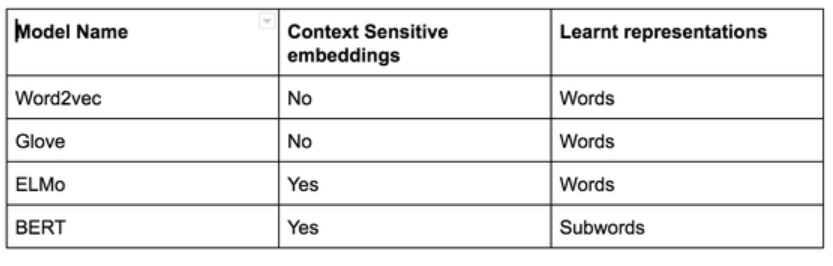

## Visualization 

### Mean Word2Vec

In [ ]:
text = mean_w2v.transform(sents_pd)

In [ ]:
tsne_input = pd.DataFrame(text, index=sents_pd.text)
tsne_input.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299
text,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
chapter 1,-0.187486,-0.007507,-0.054072,-0.129069,0.129716,-0.003974,-0.326335,0.188057,0.084727,0.148074,0.156331,-0.196831,-0.002827,0.020539,0.109876,-0.049885,0.082749,0.291063,0.054258,0.211329,0.074227,0.165173,0.045570,0.210531,0.053092,0.341820,-0.047679,0.074127,-0.297439,0.270182,0.011327,-0.078240,0.163319,0.212749,0.053644,-0.151617,0.118664,0.000225,-0.216186,-0.197064,...,-0.048583,-0.031205,-0.125205,-0.092738,0.055565,-0.139321,0.227261,-0.165452,-0.028287,-0.095264,0.020261,0.021845,0.126424,0.179797,0.012557,0.025556,0.046785,-0.060978,-0.049847,0.288302,-0.032650,0.218896,-0.045766,-0.055841,-0.096914,0.093343,-0.045451,0.144697,0.112585,-0.115192,-0.001444,-0.292496,-0.096705,0.189785,0.113433,-0.025021,0.291523,0.117645,-0.057731,0.050383
day low probability disclaimer j,-0.116166,-0.023435,-0.034877,-0.075461,0.108363,-0.021027,-0.247827,0.145412,0.095563,0.098236,0.103116,-0.137741,-0.037510,0.018378,0.096821,-0.062840,0.052136,0.218028,0.031087,0.144158,0.060618,0.147908,0.002198,0.180422,0.028219,0.302900,-0.004210,0.024414,-0.227334,0.223935,0.012402,-0.089364,0.105712,0.149081,-0.007318,-0.127980,0.105773,-0.019315,-0.197423,-0.139680,...,-0.016087,-0.051389,-0.105172,-0.055053,0.006416,-0.109482,0.154155,-0.121096,0.003699,-0.098819,0.008690,-0.001506,0.090926,0.157172,-0.003539,-0.011185,0.045113,-0.054165,-0.000966,0.170617,-0.018298,0.174568,0.001092,-0.039210,-0.069506,0.094732,-0.038319,0.116425,0.071149,-0.117873,-0.001891,-0.209778,-0.089290,0.135950,0.079649,-0.025256,0.188284,0.057731,-0.044179,0.017621
rowling owns harry potter one owns method rationality,-0.142076,-0.016700,-0.062386,-0.126969,0.141974,-0.012579,-0.276484,0.112490,0.082518,0.164450,0.145136,-0.114285,0.029590,-0.017344,0.070902,-0.086614,0.044495,0.229565,0.093495,0.199467,0.028636,0.137452,-0.006599,0.163057,0.069900,0.270486,-0.110937,0.038360,-0.209564,0.207303,-0.007051,-0.016269,0.146942,0.105290,0.021294,-0.089072,0.064102,0.004810,-0.113279,-0.192203,...,-0.085266,0.045338,-0.105280,-0.074624,0.051341,-0.083554,0.113782,-0.115076,-0.018072,0.002412,0.018143,0.071996,0.111143,0.097797,0.022476,0.063286,0.051355,-0.011147,-0.022150,0.203814,-0.080751,0.180269,0.005935,-0.039867,-0.037434,0.047928,-0.056158,0.045323,0.086523,-0.078007,0.024321,-0.194016,-0.100191,0.176498,0.067004,-0.035550,0.207799,0.056720,-0.073163,0.049664
fic widely considered really hit stride starting around chapter 5,-0.149298,-0.025751,-0.045871,-0.114819,0.113470,-0.030677,-0.267168,0.173038,0.070022,0.132652,0.127183,-0.159687,-0.005385,0.030512,0.074204,-0.048512,0.077674,0.254715,0.046496,0.153821,0.057337,0.115773,0.022424,0.164137,0.046623,0.255487,-0.048239,0.062461,-0.254103,0.209028,0.003350,-0.019529,0.140354,0.153903,0.041215,-0.125511,0.094045,0.001750,-0.117389,-0.195150,...,-0.063199,-0.022961,-0.084317,-0.059848,0.069155,-0.115642,0.183738,-0.169370,-0.027857,-0.074471,0.017065,0.038608,0.119227,0.142637,-0.004556,0.031188,0.035735,-0.060442,-0.080643,0.241561,-0.028897,0.205513,-0.031306,-0.074513,-0.070285,0.079858,-0.059047,0.076860,0.085181,-0.082022,0.006300,-0.239865,-0.107775,0.162474,0.082641,-0.020059,0.217470,0.097269,-0.051948,0.041111
still like chapter 10 give,-0.146849,-0.061419,-0.071490,-0.111554,0.163578,-0.043900,-0.283447,0.212470,0.075659,0.126262,0.144051,-0.183674,-0.018804,0.008372,0.104667,-0.094103,0.049181,0.315829,0.050765,0.179054,0.065455,0.139812,0.010706,0.186444,0.040065,0.320750,-0.077644,0.049426,-0.300494,0.224973,0.053095,0.003382,0.180244,0.151590,0.023504,-0.137956,0.100293,-0.012655,-0.148655,-0.262089,...,-0.071779,-0.025860,-0.094930

To project 300 dimensional embedding vectors onto a plane, we use the t-SNE [[1]](http://www.jmlr.org/papers/volume9/vandermaaten08a/vandermaaten08a.pdf) method , which allows you to project multidimensional vectors onto a plane informatively.

In [ ]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=0)
tsne_vectors = tsne.fit_transform(tsne_input.values)

In [ ]:
tsne_vectors = pd.DataFrame(tsne_vectors,
                            index=pd.Index(tsne_input.index),
                            columns=[u'x_coord', u'y_coord'])

tsne_vectors.head()

,x_coord,y_coord
text,,
chapter 1,-13.905312,16.476912
day low probability disclaimer j,-22.250250,28.267683
rowling owns harry potter one owns method rationality,-9.296906,5.956119
fic widely considered really hit stride starting around chapter 5,-19.060764,15.493262
still like chapter 10 give,-7.782661,11.060024


In [ ]:
from bokeh.models import ColumnDataSource, LabelSet, HoverTool
from bokeh.plotting import figure, show, output_file
from bokeh.core.properties import value
from bokeh.io import output_notebook
output_notebook()

def tsne_show(embedding, data, ELMA = None, N = 0):
  if ELMA is None:
    text = embedding(data)
    tsne_input = pd.DataFrame(text, index=data.text)
  else:
    text = elmo_vectors(data[:N])
    tsne_input = pd.DataFrame(text, index=sents_pd[:N].text)
    
  tsne = TSNE(n_components=2, random_state=0)
  tsne_vectors = tsne.fit_transform(tsne_input.values)
  tsne_vectors = pd.DataFrame(tsne_vectors,
                            index=pd.Index(tsne_input.index),
                            columns=[u'x_coord', u'y_coord'])
  

  # add our DataFrame as a ColumnDataSource for Bokeh
  plot_data = ColumnDataSource(tsne_vectors)

  # create the plot and configure the
  # title, dimensions, and tools
  tsne_plot = figure(title=u't-SNE Word Embeddings',
                     plot_width = 800,
                     plot_height = 800,
                     tools= (u'pan, wheel_zoom, box_zoom,'
                             u'box_select, reset'),
                     active_scroll=u'wheel_zoom')

  # add a hover tool to display words on roll-over
  tsne_plot.add_tools( HoverTool(tooltips = [('sentence', u'@text'),
                                             ("(x,y)", "(@x_coord, @y_coord)")] ))
  #labels = LabelSet(x=u'x_coord', y=u'y_coord', text=u'word', y_offset=6,
                    #text_font_size=u'8pt', text_color=u'#555555',
                    #source=plot_data, text_align='center')
  #tsne_plot.add_layout(labels)

  # draw the words as circles on the plot
  tsne_plot.circle(u'x_coord', u'y_coord', source=plot_data,
                   color=u'orange', line_alpha=0.6, fill_alpha=0.3,
                   size=5, hover_line_color=u'black')

  # configure visual elements of the plot
  tsne_plot.title.text_font_size = value(u'16pt')
  tsne_plot.xaxis.visible = True
  tsne_plot.yaxis.visible = True
  # engage!
  show(tsne_plot);

# Hometask 4

Create the same visualization for weighted mean W2V, mean W2V and weighted W2V for Fastext/other pretrained W2V, Doc2Vec and your own other embedding: ELMo, etc.

In [ ]:
#YOUR CODE HERE
tsne = TSNE(n_components=2, random_state=0)
tsne_vectors = tsne.fit_transform(tsne_input.values)

In [ ]:
mean_w2v = mean_w2v.transform(sents_pd)
weighted_mean_w2v_data = weighted_mean_w2v.fit(sents_pd.text.values, sents_pd.text.values).transform(sents_pd)
d2v_data = d2v.transform(sents_pd)

In [ ]:
tsne_show(mean_w2v, sents_pd)

In [ ]:
tsne_show(d2v,sents_pd)

In [ ]:
weighted_mean_w2v = TfidfEmbeddingVectorizer(w2v)
weighted_mean_w2v.fit(sents_pd.text.values, sents_pd.text.values).transform(sents_pd[:10])

[array([-1.54307938e+00, -8.52789134e-02, -4.58663583e-01, -1.05870795e+00,
         1.06826591e+00, -5.15043251e-02, -2.64750004e+00,  1.53473830e+00,
         6.82948112e-01,  1.21555173e+00,  1.25648379e+00, -1.58911884e+00,
        -1.32135805e-02,  1.56574398e-01,  8.91018748e-01, -4.55083430e-01,
         6.72581196e-01,  2.38166523e+00,  4.65557158e-01,  1.71431708e+00,
         5.95007002e-01,  1.33380711e+00,  3.39297831e-01,  1.70213985e+00,
         4.29330617e-01,  2.76731324e+00, -4.23566133e-01,  6.08058155e-01,
        -2.41440606e+00,  2.18711972e+00,  1.11855239e-01, -5.58111072e-01,
         1.34642291e+00,  1.70924997e+00,  4.14755881e-01, -1.25422442e+00,
         9.56619978e-01,  1.88122620e-03, -1.72073650e+00, -1.65481639e+00,
        -1.08559465e+00, -2.37455034e+00, -1.96764320e-01, -1.82251322e+00,
        -1.07925904e+00, -2.36765921e-01, -6.16579711e-01, -1.27765715e+00,
        -2.41271883e-01, -1.34774923e+00, -2.35413209e-01, -1.18300807e+00,
        -1.0

In [ ]:
tsne_show(weighted_mean_w2v,sents_pd)

In [ ]:
tsne_show(mean_fasttext, sents_pd)

In [ ]:
tsne_show(embeddings, vocabulary, ELMA = True, N = 300)

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


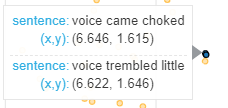

### The context is being extracted as it should be, but if i give more than 300 samples, the OOM error occurs